# Task 0c - HVG Selection
This notebook does HVG selection of the data. This is the third step and requires the adata from the second step, Task 0b - Normalization.

This notebook is based on the single-cell tutorial (https://github.com/theislab/single-cell-tutorial). For further explanations of the applied methods please refer to above source.

In [1]:
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
from os import listdir
from os.path import isfile, join
import logging

In [2]:
plt.rcParams['figure.figsize']=(8,8) 
sc.settings.verbosity = 3

### IMPORT ADATA OF QC

In [3]:
adata = sc.read_h5ad('../data/adata/norm_adata.h5ad')

### Split adata into the adata of the samples

In [4]:
adata1 = adata[adata.obs.sample_id=='9591-2D']
adata2 = adata[adata.obs.sample_id=='9591-3D']
adata3 = adata[adata.obs.sample_id=='16992-2D']
adata4 = adata[adata.obs.sample_id=='16992-3D']

## Highly Variable Genes

In [5]:
sc.pp.highly_variable_genes(adata1, flavor='cell_ranger', n_top_genes=4000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata1.var['highly_variable'])))

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:04)


/home/icb/till.richter/anaconda3/envs/scib-pipeline-R4.0/lib/python3.7/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 4000


/home/icb/till.richter/anaconda3/envs/scib-pipeline-R4.0/lib/python3.7/contextlib.py:119: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


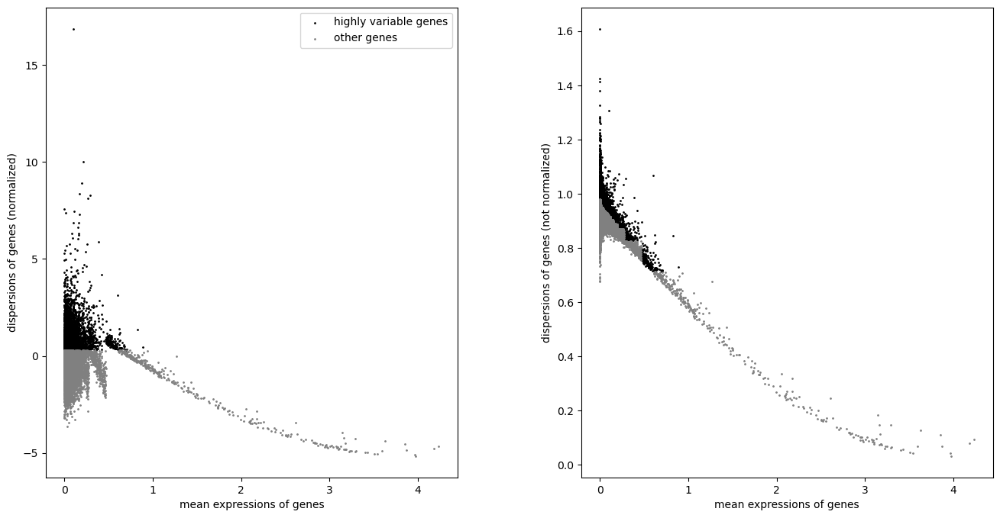

In [6]:
sc.pl.highly_variable_genes(adata1)

In [7]:
sc.pp.highly_variable_genes(adata2, flavor='cell_ranger', n_top_genes=4000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata2.var['highly_variable'])))

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)


/home/icb/till.richter/anaconda3/envs/scib-pipeline-R4.0/lib/python3.7/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 4000


/home/icb/till.richter/anaconda3/envs/scib-pipeline-R4.0/lib/python3.7/contextlib.py:119: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


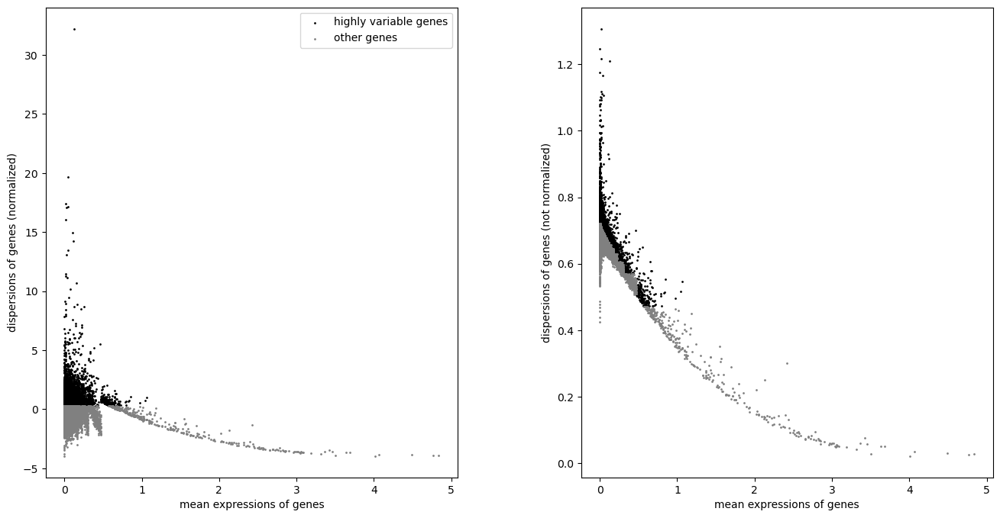

In [8]:
sc.pl.highly_variable_genes(adata2)

In [9]:
sc.pp.highly_variable_genes(adata3, flavor='cell_ranger', n_top_genes=4000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata3.var['highly_variable'])))

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)


/home/icb/till.richter/anaconda3/envs/scib-pipeline-R4.0/lib/python3.7/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 4000


/home/icb/till.richter/anaconda3/envs/scib-pipeline-R4.0/lib/python3.7/contextlib.py:119: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


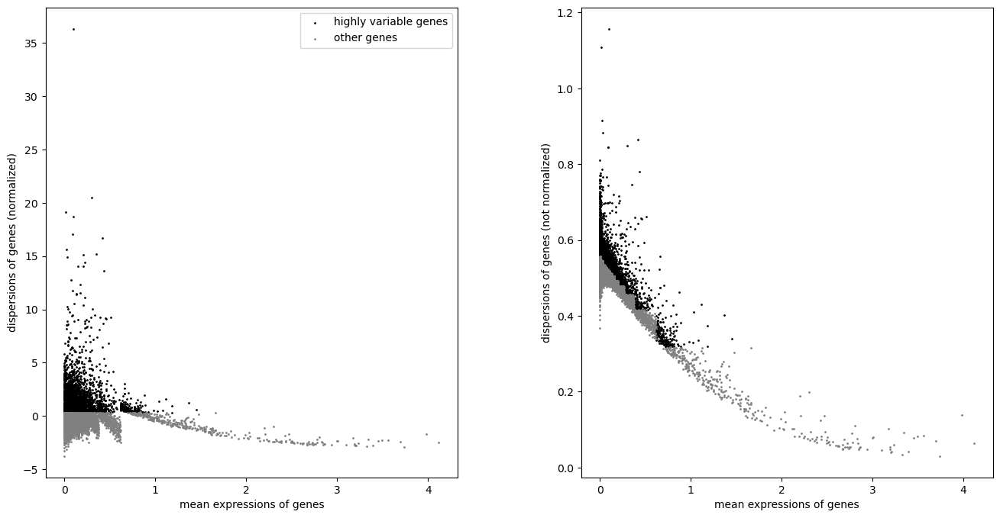

In [10]:
sc.pl.highly_variable_genes(adata3)

In [11]:
sc.pp.highly_variable_genes(adata4, flavor='cell_ranger', n_top_genes=4000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata4.var['highly_variable'])))

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)


/home/icb/till.richter/anaconda3/envs/scib-pipeline-R4.0/lib/python3.7/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 4000


/home/icb/till.richter/anaconda3/envs/scib-pipeline-R4.0/lib/python3.7/contextlib.py:119: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


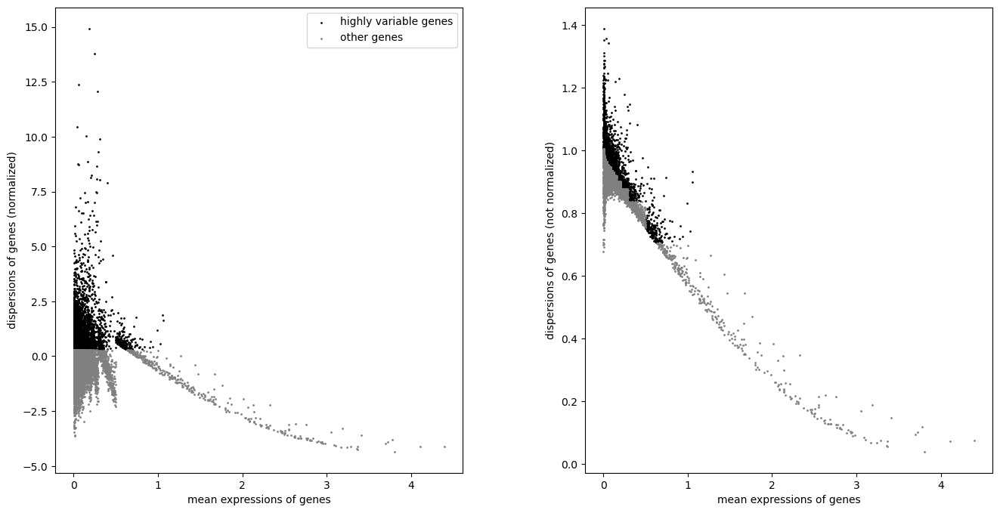

In [12]:
sc.pl.highly_variable_genes(adata4)

<a id="Visualization"></a>

## Visualization

### Sample 1 : 9591-2D

In [13]:
# Calculate the visualizations
sc.pp.pca(adata1, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata1)

sc.tl.tsne(adata1, n_jobs=12) #Note n_jobs works for MulticoreTSNE, but not regular implementation)
sc.tl.umap(adata1)
sc.tl.diffmap(adata1)
sc.tl.draw_graph(adata1)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:16)
computing neighbors
    using 'X_pca' with n_pcs = 50


/home/icb/till.richter/anaconda3/envs/scib-pipeline-R4.0/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:14)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE


/home/icb/till.richter/anaconda3/envs/scib-pipeline-R4.0/lib/python3.7/site-packages/scanpy/tools/_tsne.py:115: UserWarning: In previous versions of scanpy, calling tsne with n_jobs > 1 would use MulticoreTSNE. Now this uses the scikit-learn version of TSNE by default. If you'd like the old behaviour (which is deprecated), pass 'use_fast_tsne=True'. Note, MulticoreTSNE is not actually faster anymore.
  "In previous versions of scanpy, calling tsne with n_jobs > 1 would use "
/home/icb/till.richter/anaconda3/envs/scib-pipeline-R4.0/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:01:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:15)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9650939  0.9574792  0.94231725 0.9203999  0.8864097
     0.8735109  0.85299057 0.84103894 0.82844144 0.81553286 0.81335396
     0.8051455  0.79582745 0.7944746 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fr', graph_drawing coordinates (adata.obsm) (0:05:58)


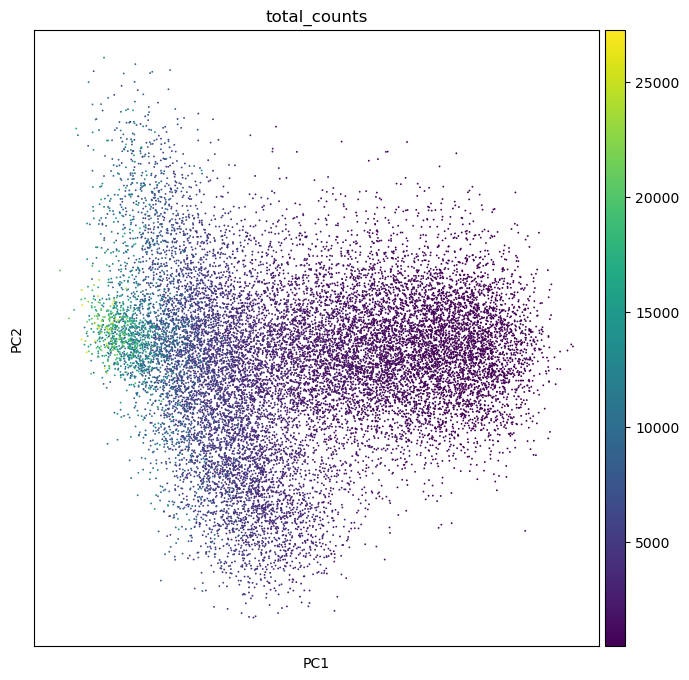

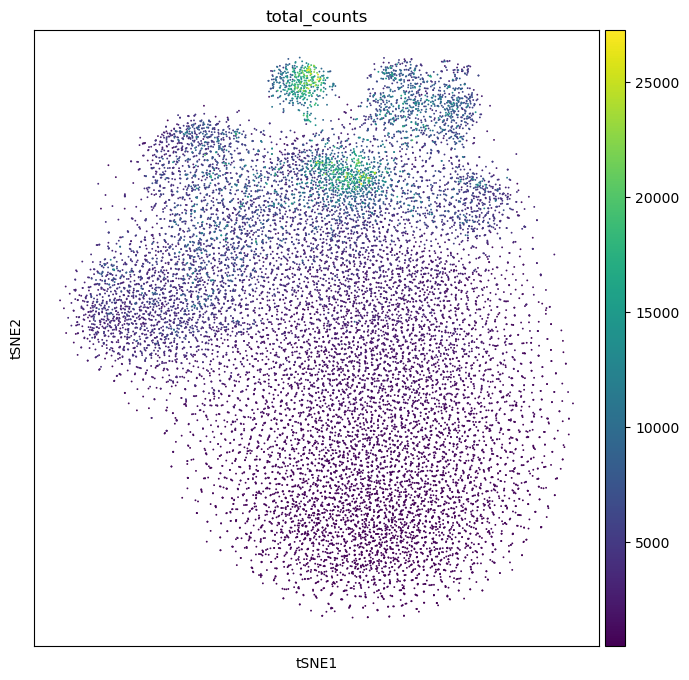

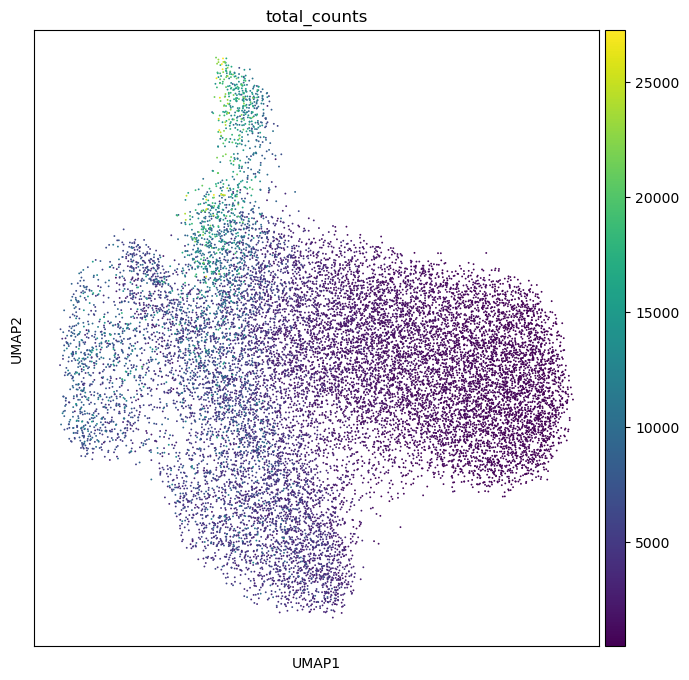

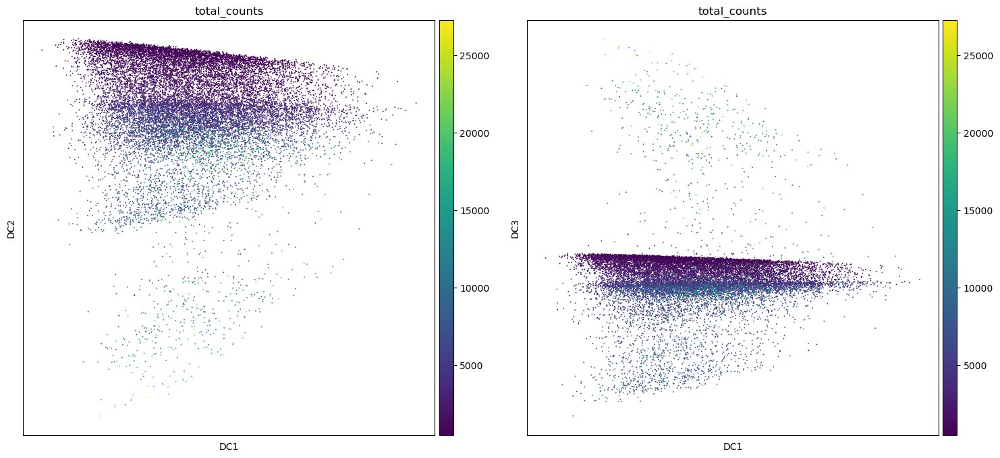

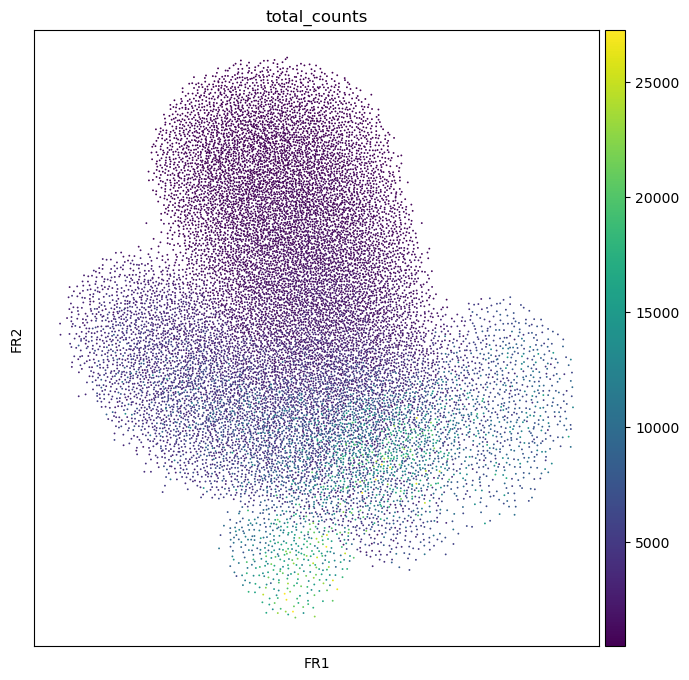

In [14]:
sc.pl.pca_scatter(adata1, color='total_counts')
sc.pl.tsne(adata1, color='total_counts')
sc.pl.umap(adata1, color='total_counts')
sc.pl.diffmap(adata1, color='total_counts', components=['1,2','1,3'])
sc.pl.draw_graph(adata1, color='total_counts')

### Sample 2: 9591-3D

In [15]:
# Calculate the visualizations
sc.pp.pca(adata2, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata2)

sc.tl.tsne(adata2, n_jobs=12) # Note n_jobs works for MulticoreTSNE, but not regular implementation)
sc.tl.umap(adata2)
sc.tl.diffmap(adata2)
sc.tl.draw_graph(adata2)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:05)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE


/home/icb/till.richter/anaconda3/envs/scib-pipeline-R4.0/lib/python3.7/site-packages/scanpy/tools/_tsne.py:115: UserWarning: In previous versions of scanpy, calling tsne with n_jobs > 1 would use MulticoreTSNE. Now this uses the scikit-learn version of TSNE by default. If you'd like the old behaviour (which is deprecated), pass 'use_fast_tsne=True'. Note, MulticoreTSNE is not actually faster anymore.
  "In previous versions of scanpy, calling tsne with n_jobs > 1 would use "
/home/icb/till.richter/anaconda3/envs/scib-pipeline-R4.0/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:38)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9693782  0.9312809  0.9174285  0.90883744 0.8932673
     0.873252   0.8512703  0.8393492  0.8303     0.8017792  0.8001781
     0.79661715 0.7822243  0.7751718 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fr', graph_drawing coordinates (adata.obsm) (0:03:16)


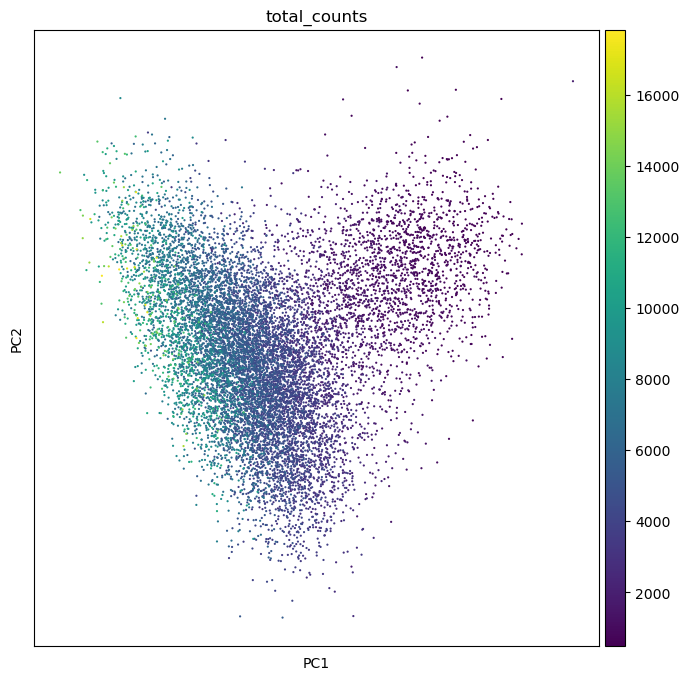

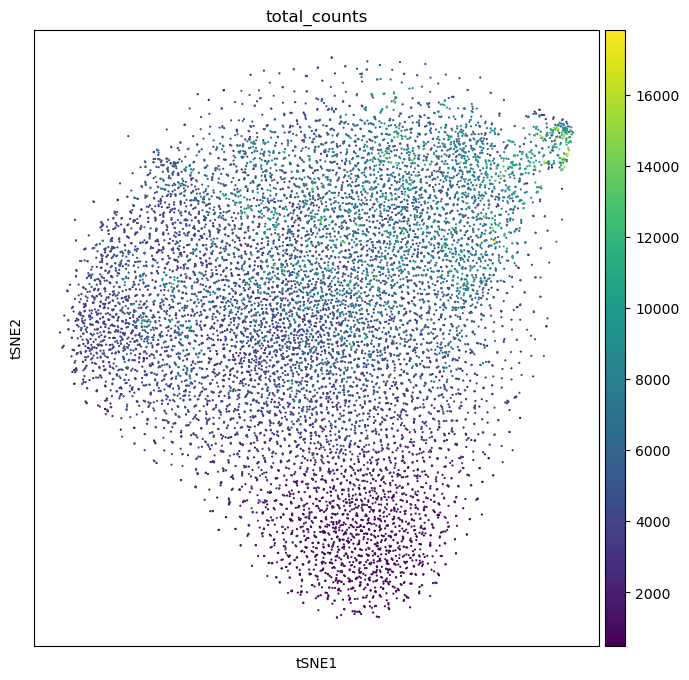

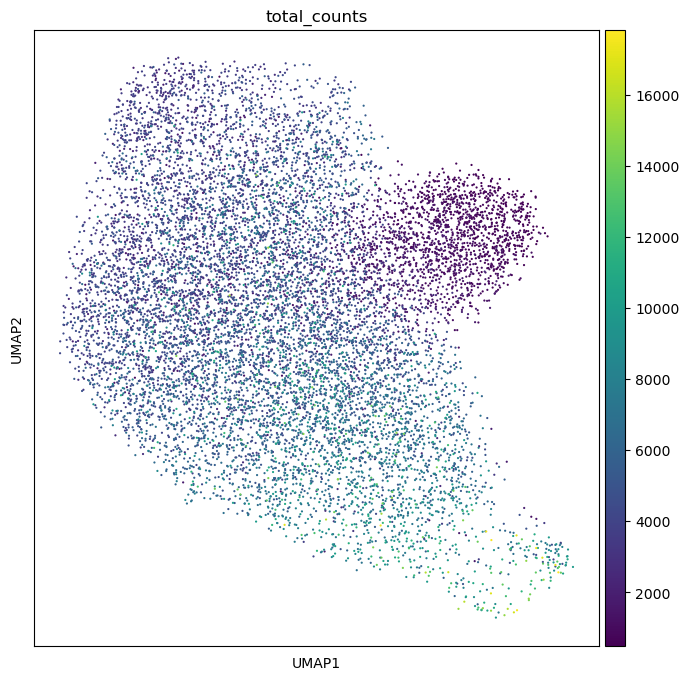

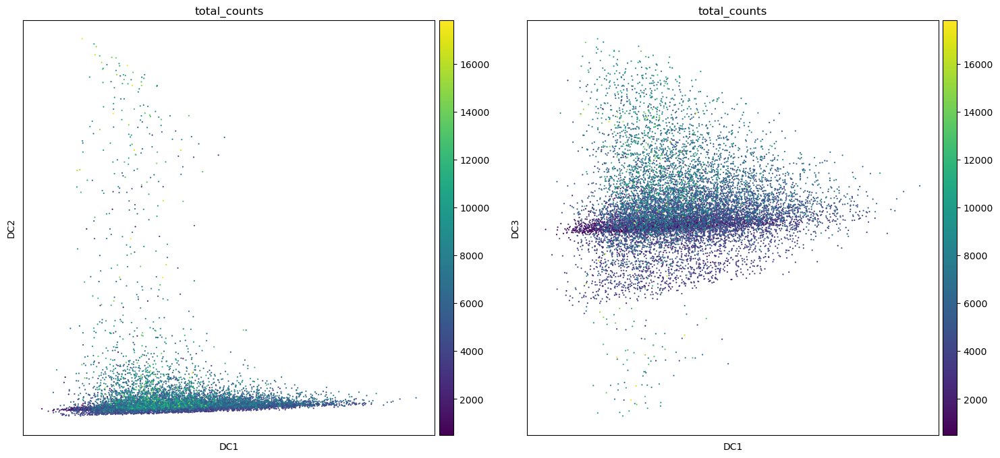

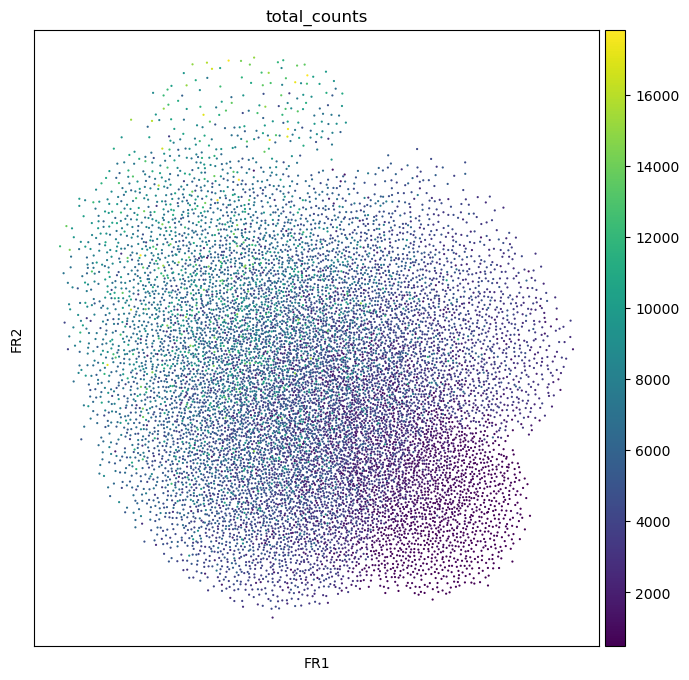

In [16]:
sc.pl.pca_scatter(adata2, color='total_counts')
sc.pl.tsne(adata2, color='total_counts')
sc.pl.umap(adata2, color='total_counts')
sc.pl.diffmap(adata2, color='total_counts', components=['1,2','1,3'])
sc.pl.draw_graph(adata2, color='total_counts')

### Sample 3: 16992-2D

In [17]:
# Calculate the visualizations
sc.pp.pca(adata3, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata3)

sc.tl.tsne(adata3, n_jobs=12) # Note n_jobs works for MulticoreTSNE, but not regular implementation)
sc.tl.umap(adata3)
sc.tl.diffmap(adata3)
sc.tl.draw_graph(adata3)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:09)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE


/home/icb/till.richter/anaconda3/envs/scib-pipeline-R4.0/lib/python3.7/site-packages/scanpy/tools/_tsne.py:115: UserWarning: In previous versions of scanpy, calling tsne with n_jobs > 1 would use MulticoreTSNE. Now this uses the scikit-learn version of TSNE by default. If you'd like the old behaviour (which is deprecated), pass 'use_fast_tsne=True'. Note, MulticoreTSNE is not actually faster anymore.
  "In previous versions of scanpy, calling tsne with n_jobs > 1 would use "
/home/icb/till.richter/anaconda3/envs/scib-pipeline-R4.0/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:26)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:21)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9789679  0.96973157 0.9585408  0.93772227 0.93230885
     0.92531997 0.903637   0.8939363  0.88383555 0.8736548  0.86336213
     0.86058915 0.8505707  0.8497216 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fr', graph_drawing coordinates (adata.obsm) (0:01:49)


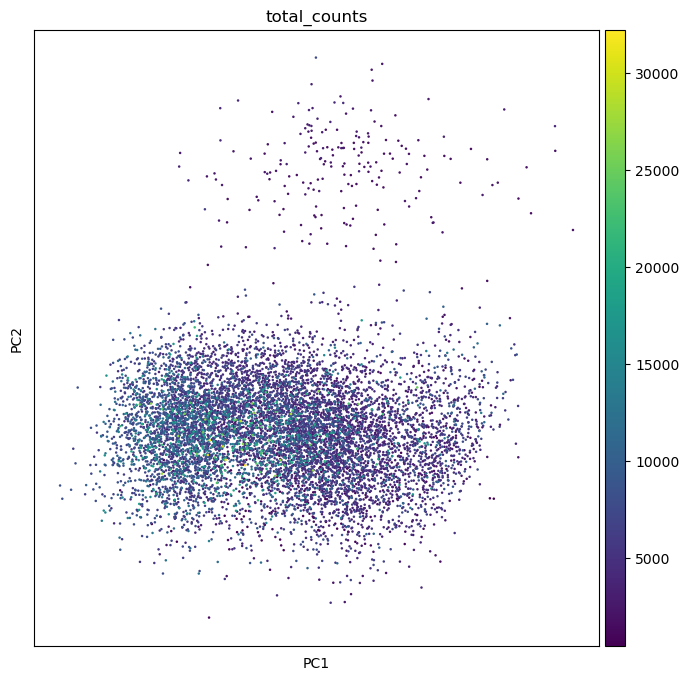

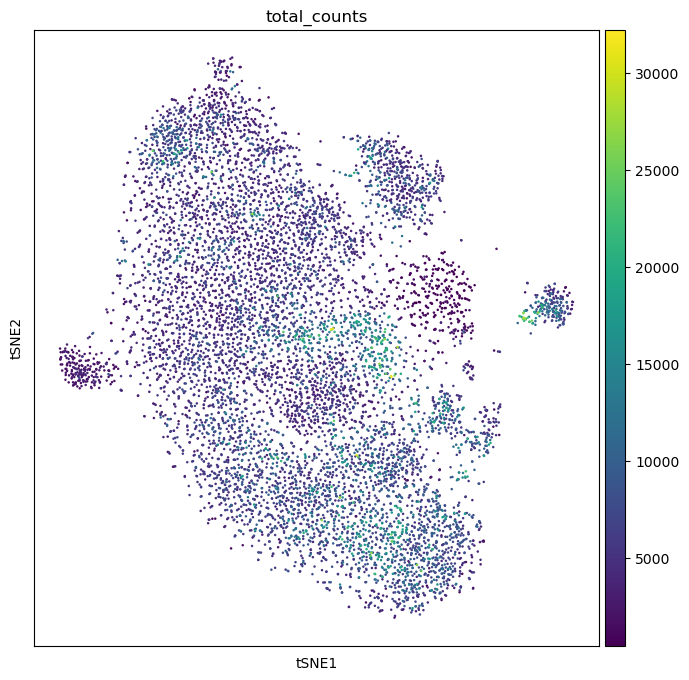

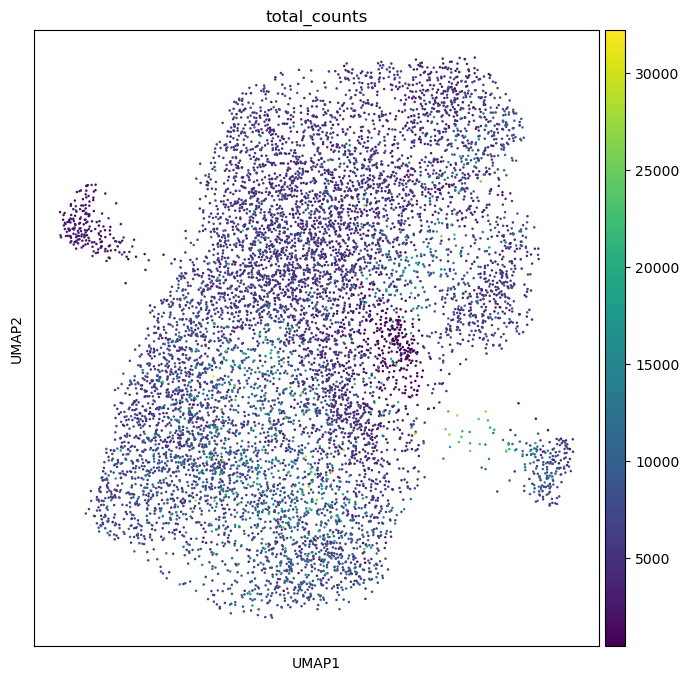

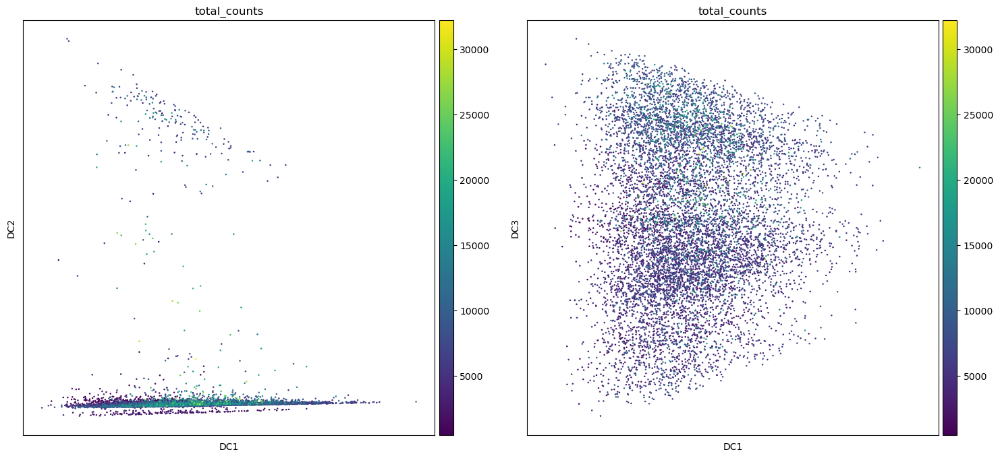

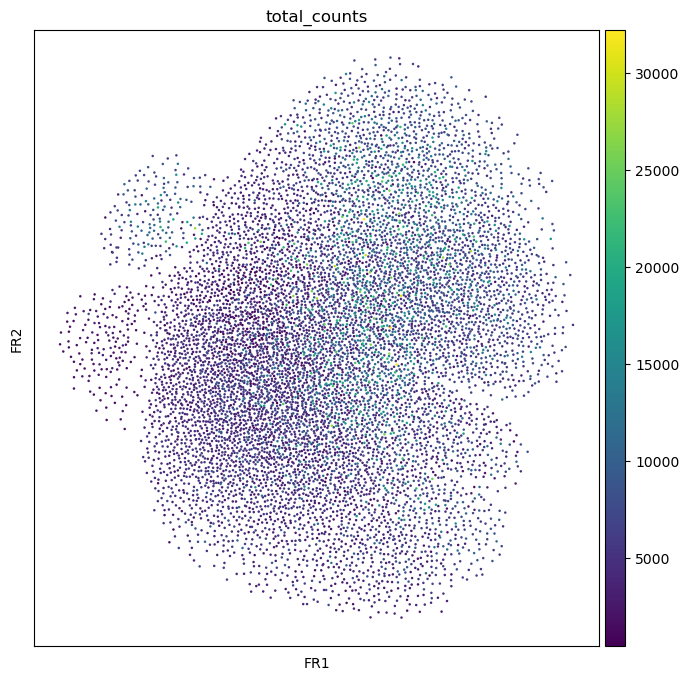

In [18]:
sc.pl.pca_scatter(adata3, color='total_counts')
sc.pl.tsne(adata3, color='total_counts')
sc.pl.umap(adata3, color='total_counts')
sc.pl.diffmap(adata3, color='total_counts', components=['1,2','1,3'])
sc.pl.draw_graph(adata3, color='total_counts')

### Sample 4: 16992-3D

In [19]:
# Calculate the visualizations
sc.pp.pca(adata4, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata4)

sc.tl.tsne(adata4, n_jobs=12) # Note n_jobs works for MulticoreTSNE, but not regular implementation)
sc.tl.umap(adata4)
sc.tl.diffmap(adata4)
sc.tl.draw_graph(adata4)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:16)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE


/home/icb/till.richter/anaconda3/envs/scib-pipeline-R4.0/lib/python3.7/site-packages/scanpy/tools/_tsne.py:115: UserWarning: In previous versions of scanpy, calling tsne with n_jobs > 1 would use MulticoreTSNE. Now this uses the scikit-learn version of TSNE by default. If you'd like the old behaviour (which is deprecated), pass 'use_fast_tsne=True'. Note, MulticoreTSNE is not actually faster anymore.
  "In previous versions of scanpy, calling tsne with n_jobs > 1 would use "
/home/icb/till.richter/anaconda3/envs/scib-pipeline-R4.0/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:01:10)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:19)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.97356576 0.96558994 0.95512396 0.9362568  0.9187189
     0.89588326 0.8856143  0.8672072  0.8587795  0.8492794  0.8433107
     0.8326317  0.8230956  0.8200696 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fr', graph_drawing coordinates (adata.obsm) (0:08:53)


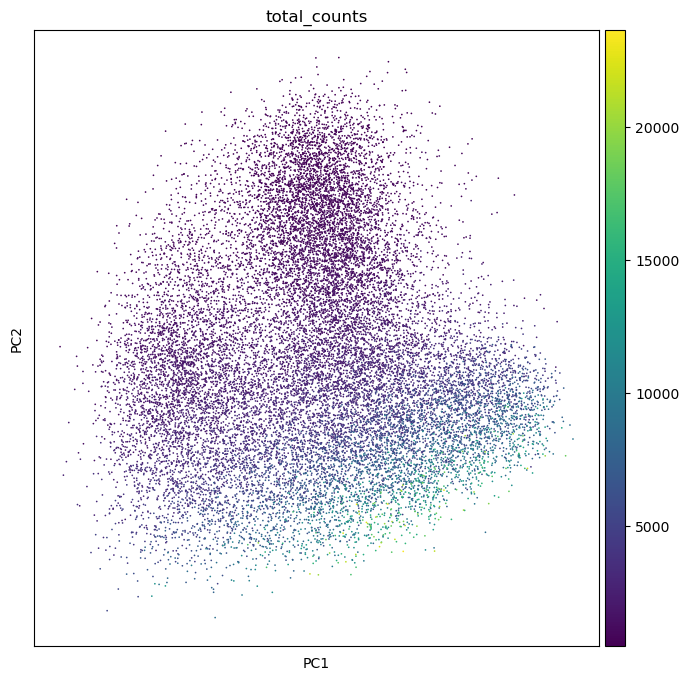

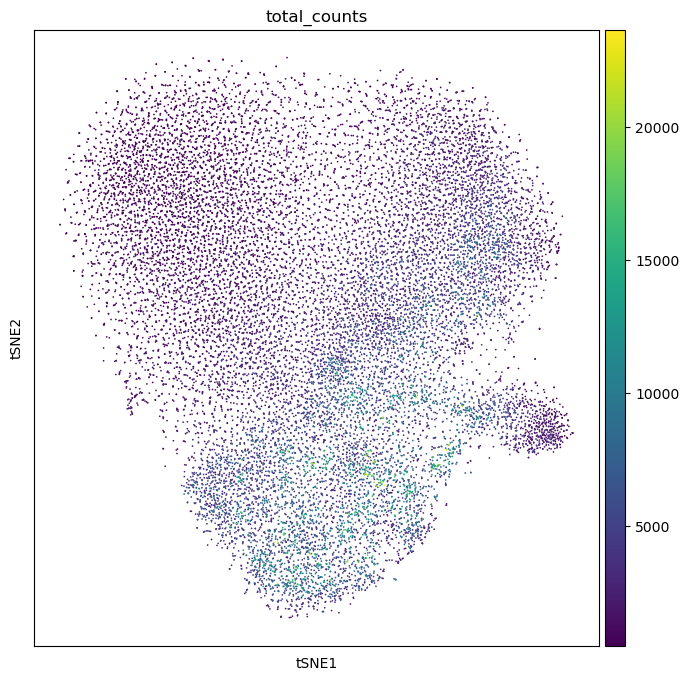

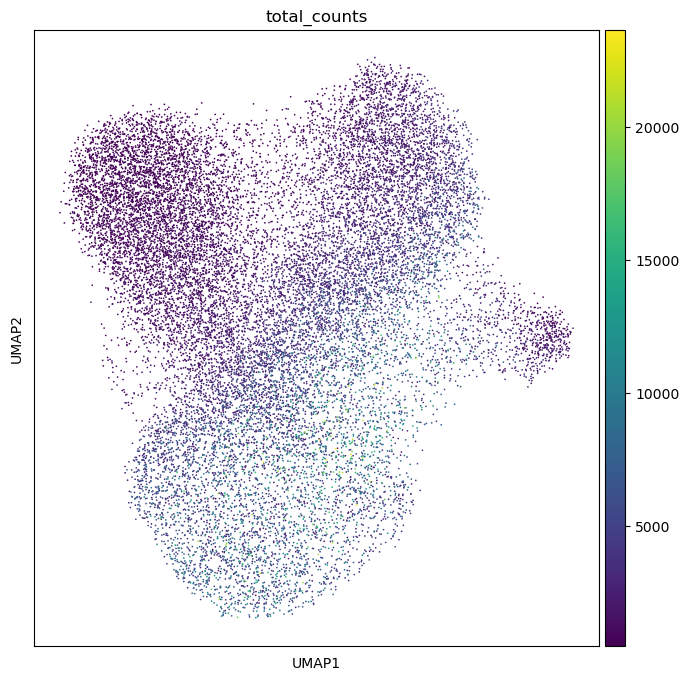

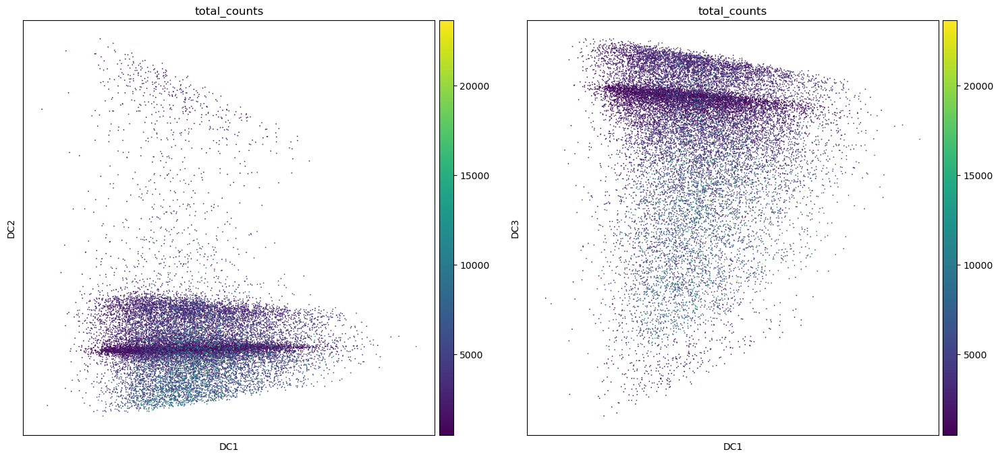

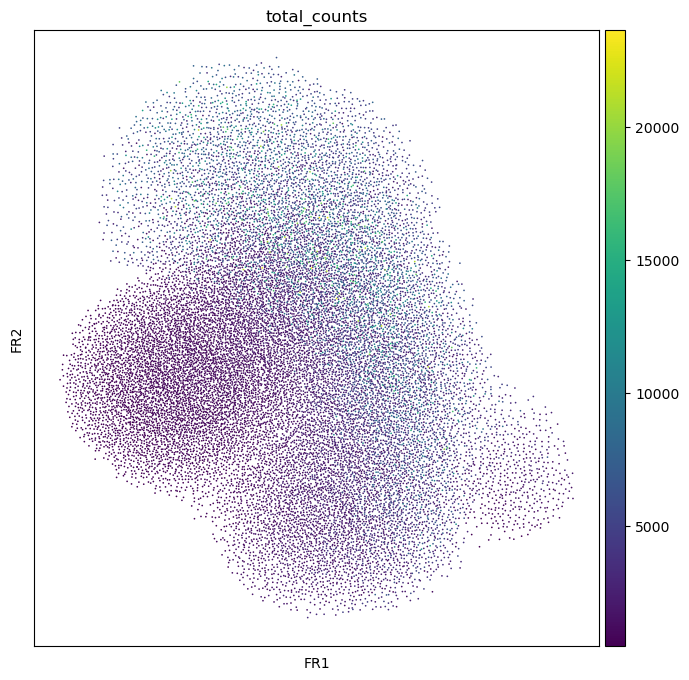

In [20]:
sc.pl.pca_scatter(adata4, color='total_counts')
sc.pl.tsne(adata4, color='total_counts')
sc.pl.umap(adata4, color='total_counts')
sc.pl.diffmap(adata4, color='total_counts', components=['1,2','1,3'])
sc.pl.draw_graph(adata4, color='total_counts')

<a id="CC"></a>

In [21]:
# Save processed adatas
adata1.write_h5ad('../data/adata/processed_adata1.h5ad')
adata2.write_h5ad('../data/adata/processed_adata2.h5ad')
adata3.write_h5ad('../data/adata/processed_adata3.h5ad')
adata4.write_h5ad('../data/adata/processed_adata4.h5ad')